In [1]:
import copy
from pathlib import Path
from typing import Dict, List, Tuple, Optional
from collections import defaultdict

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import ttest_rel

In [2]:
sns.set_context('paper', font_scale=1.2)
sns.set_style('whitegrid', {
    'grid.linestyle': '--',
    'grid.alpha': 0.6,
})

plt.rcParams.update({
    # Font
    'font.family': 'serif',
    'font.serif': ['DejaVu Serif', 'Computer Modern Roman'],
    'text.usetex': False,
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'legend.fontsize': 10,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,

    # Lines / Markers
    'lines.linewidth': 1.5,
    'lines.markersize': 6,
    'axes.linewidth': 1.0,

    # Axes
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.size': 5,
    'ytick.major.size': 5,

    # Figure dpi & size
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'figure.figsize': (6, 4),
    'figure.autolayout': True,
})

In [3]:
def load_results(
        files: List[Path],
        classifier: str,
) -> Tuple[Dict[str, Dict[str, Dict[str, float]]], List[str]]:
    """
    Load experiment results from CSV files and orgnanize them into a nested dictionary.

    Args:
        files (List[Path]): List of CSV file paths.
    
    Returns:
        Tuple containing:
            - table: Nested dict {metric: {dataeset: {method: value}}}
            - methods: Sorted list of unique method names.
    """
    table: Dict[str, Dict[str, Dict[str, float]]] = defaultdict(lambda: defaultdict(dict))
    methods: set = set()

    for fp in files:
        dataset = fp.stem.replace('_results', '')
        df = pd.read_csv(fp)

        # Drop Rank column if present
        df = df.drop(columns=['Rank'], errors='ignore')

        # Keep only rows for our target method and the target classifier
        mask = (df['Classifier'] == classifier)
        
        for _, row in df.loc[mask].iterrows():
            method = row['Method']
            metric = row['Metric']
            value = float(row['Value'])
            table[metric][dataset][method] = value
            methods.add(method)
    
    return table, sorted(methods)

In [4]:
def load_ablation_results(
    base_table: Dict[str, Dict[str, Dict[str, float]]],
    files: List[Path],
    target_method: str = 'Ours',
    classifier: str = 'RandomForest',
) -> Dict[float, Dict[str, Dict[str, Dict[str, float]]]]:
    """
    Update base experiment table with ablation study results for a specific method.

    Args:
        base_table (Dict[str, Dict[str, Dict[str, float]]]): Base experiment results.
        files (List[Path]): List of CSV file paths for ablation study.
        target_method (str): The method to update with ablation results.
    
    Returns:
        Dict mapping beta values to updated nested tables.
    """
    ablation_results: Dict[float, Dict[str, Dict[str, Dict[str, float]]]] = {}

    for fp in files:
        stem = fp.stem
        try:
            dataset, beta_srt = stem.rsplit('_results_gaussian_beta_', 1)
        except ValueError:
            raise ValueError(f"Unexpected filename format: {fp.name}")
        
        beta = float(beta_srt)

        # Initialize a deep copy of the base table for this beta if needed
        if beta not in ablation_results:
            ablation_results[beta] = copy.deepcopy(base_table)

        df = pd.read_csv(fp)
        # Keep only rows for our target method and the SVM classifier
        mask = (df['Method'] == target_method) & (df['Classifier'] == classifier)
        for _, row in df.loc[mask].iterrows():
            metric = row['Metric']
            value = float(row['Value'])
            ablation_results[beta][metric][dataset][target_method] = value
    
    return ablation_results

In [5]:
CLASSIFIER = 'SVM'

In [6]:
BASE_RES_DIR = Path('/data4/oldrain123/oldrain123/results/ablation_results/classifiers')
BASE_BETA_DIR = Path('/data4/oldrain123/oldrain123/results/ablation_results/beta8')

files_real: List[Path] = sorted(BASE_RES_DIR.glob('*_results.csv'))
files_beta: List[Path] = sorted(BASE_BETA_DIR.glob('*.csv'))

metric_tables, all_methods = load_results(files_real, classifier=CLASSIFIER)
ablation_metrics = load_ablation_results(metric_tables, files_beta, classifier=CLASSIFIER)

In [7]:
FIXED_METHOD_ORDER: List[str] = [
    'Original', 'ROS', 'SMOTE', 'bSMOTE', 
    'ADASYN', 'MWMOTE', 'CTGAN', 'Ours'
]

selected_methods: List[str] = [m for m in FIXED_METHOD_ORDER if m in all_methods]

df_by_beta_metric: Dict[float, Dict[str, pd.DataFrame]] = {
    beta: {
        metric: (
            pd.DataFrame
              .from_dict(ds_dict, orient='index', columns=selected_methods, dtype=float)
              .reindex(columns=selected_methods)  # enforce column order
        )
        for metric, ds_dict in beta_table.items()
    }
    for beta, beta_table in ablation_metrics.items()
}

display(df_by_beta_metric[next(iter(df_by_beta_metric))]['AUROC'])

,Original,ROS,SMOTE,bSMOTE,ADASYN,MWMOTE,CTGAN,Ours
abalone9-18,0.83955,0.90445,0.89417,0.87657,0.88305,0.87842,0.84425,0.90012
arrhythmia,0.88042,0.91889,0.91080,0.89797,0.91213,0.90391,0.79388,0.91273
australian,0.91495,0.91491,0.91516,0.91443,0.91406,0.91455,0.91700,0.91463
breast-cancer,0.99003,0.98842,0.98770,0.98400,0.98457,0.98447,0.99005,0.99038
cleveland-0_vs_4,0.98624,0.98344,0.98438,0.98312,0.98312,0.98282,0.97689,0.98624
diabetes,0.82885,0.82835,0.82514,0.81719,0.82144,0.82008,0.82356,0.82785
ecoli-0-3-4_vs_5,0.97499,0.96778,0.96861,0.96917,0.95778,0.97111,0.97389,0.96334
ecoli3,0.95315,0.95422,0.95595,0.94832,0.95119,0.94985,0.94855,0.95380
ecoli4,0.96135,0.96329,0.96797,0.92374,0.95852,0.95941,0.97198,0.97785
german,0.75092,0.75664,0.74945,0.74881,0.74966,0.75061,0.74040,0.75387


In [8]:
# Dataset info: 관찰치 수와 변수 수
DATASET_INFO = {
    'pima': (768, 8), 'yeast4': (1484, 8), 'yeast-1-2-8-9_vs_7': (947, 8),
    'us_crime': (1994, 100), 'ecoli-0-3-4_vs_5': (200, 7),
    'winequality-white-3_vs_7': (900, 11), 'glass-0-1-6_vs_5': (184, 9),
    'cleveland-0_vs_4': (177, 13), 'ecoli3': (336, 7),
    'winequality-white-3-9_vs_5': (1482, 11), 'yeast-0-5-6-7-9_vs_4': (528, 8),
    'abalone19': (4174, 8), 'glass4': (214, 9), 'yeast6': (1484, 8),
    'abalone9-18': (731, 8), 'wine_quality': (4898, 11), 'winequality-red-4': (1599, 11),
    'yeast-1-4-5-8_vs_7': (693, 8), 'ionosphere': (351, 34), 'winequality-red-3_vs_5': (691, 11),
    'ecoli4': (336, 7), 'glass-0-1-2-3_vs_4-5-6': (214, 9), 'segment0': (2308, 19),
    'arrhythmia': (452, 278), 'car_eval_34': (1728, 21), 'oil': (937, 49), 'satimage': (6435, 36),
    'sick_euthyroid': (3163, 42)
}
# Imbalance ratios
IMBALANCE_RATIOS = {
    'pima': 1.87, 'yeast4': 28.1, 'yeast-1-2-8-9_vs_7': 30.57,
    'us_crime': 12, 'ecoli-0-3-4_vs_5': 9.0, 'winequality-white-3_vs_7': 44.0,
    'glass-0-1-6_vs_5': 19.44, 'cleveland-0_vs_4': 12.62, 'ecoli3': 8.6,
    'winequality-white-3-9_vs_5': 58.28, 'yeast-0-5-6-7-9_vs_4': 9.35,
    'abalone19': 129.44, 'glass4': 15.47, 'yeast6': 41.4, 'abalone9-18': 16.4,
    'wine_quality': 26, 'winequality-red-4': 29.17, 'yeast-1-4-5-8_vs_7': 22.1,
    'ionosphere': 1.79, 'winequality-red-3_vs_5': 68.1, 'ecoli4': 15.8,
    'glass-0-1-2-3_vs_4-5-6': 3.2, 'segment0': 6.02, 'arrhythmia': 17, 
    'car_eval_34': 12, 'oil': 22, 'satimage': 9.3,
    'sick_euthyroid': 9.8
}

# Build df_info with n_obs, n_feat, imbalance_ratio, minority count, obs/feat ratio
df_info = pd.DataFrame.from_dict(DATASET_INFO, orient='index', columns=['n_obs', 'n_feat'])
df_info['imbalance_ratio'] = pd.Series(IMBALANCE_RATIOS)
df_info['n_minority'] = (df_info['n_obs'] / (1 + df_info['imbalance_ratio'])).astype(int)
df_info['obs_feat_ratio'] = np.round(df_info['n_obs'] / df_info['n_feat'], 2)

In [9]:
def plot_reg_benefit(
    beta0: float,
    beta1: float,
    metric: str,
    df_num: Dict[float, Dict[str, pd.DataFrame]],
    df_info: pd.DataFrame,
) -> Tuple[plt.figure, np.ndarray]:
    """
    Plot the improvement in a given metric when comparing two beta values.

    Parameters:
        beta0 : float
            Baseline regularization coefficient.
        beta1 : float
            Higher regularization coefficient to compare against baseline.
        metric : str
            Performance metric name.
        df_num : dict
            Nested dict: {beta: {metric: DataFrame}}, where each Dataframe has
            methods as columns and datasets as index.
        df_info : pd.DataFrame
            DataFrame of dataset metadata with columns 'n_feat' and 'n_obs'.

    Returns:
        fig : matplotlib.figure.Figure
            The figure object containing the two-panel scatter plot.
        axes : np.ndarray
            Array of Axes objects for feature-count and observation-count plots.
    """
    # Extract baseline and new scores
    baseline = df_num[beta0][metric]['Ours']
    regularized = df_num[beta1][metric]['Ours']
    improvment = regularized - baseline

    # Merge improvement with dataset metadata
    df_plot = (
        df_info
        .join(improvment.rename('improvement'))
        .dropna(subset=['improvement'])
    )

    # Prepare figure with two subplots
    fig, axes = plt.subplots(
        nrows=1, ncols=2, figsize=(12, 5), constrained_layout=True
    )

    for ax, (col, xlabel) in zip(
        axes, [('n_feat', '# Features'), ('n_obs', '# Observations')]
    ):
        ax.scatter(
            df_plot[col], df_plot['improvement'],
            marker='o', alpha=0.7, edgecolor='k', linewidth=0.5
        )
        ax.set_xscale('log')
        ax.set_xlabel(xlabel, fontsize=12)
        ax.set_ylabel(f'[{metric}] Diff(beta({beta1}) - beta({beta0}))', fontsize=12)
        ax.set_title(f'[{metric}] Improvement vs {xlabel}', fontsize=13)
        ax.axhline(0, color='gray', linestyle='--', linewidth=1)
        ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)

    fig.suptitle(
        f'Regularization Benefit for {metric} [beta({beta0}) vs beta({beta1})]',
        fontsize=14
    )
    plt.show()
    return fig, axes

In [10]:
BETA1 = 0.01

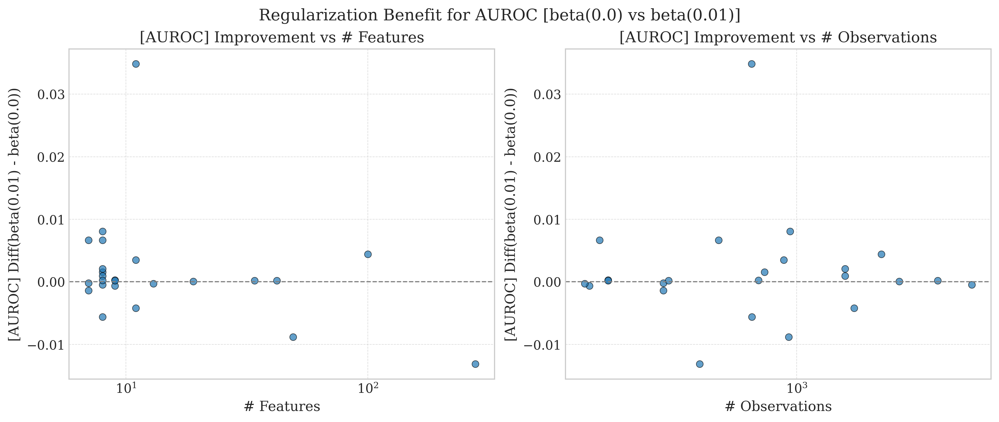

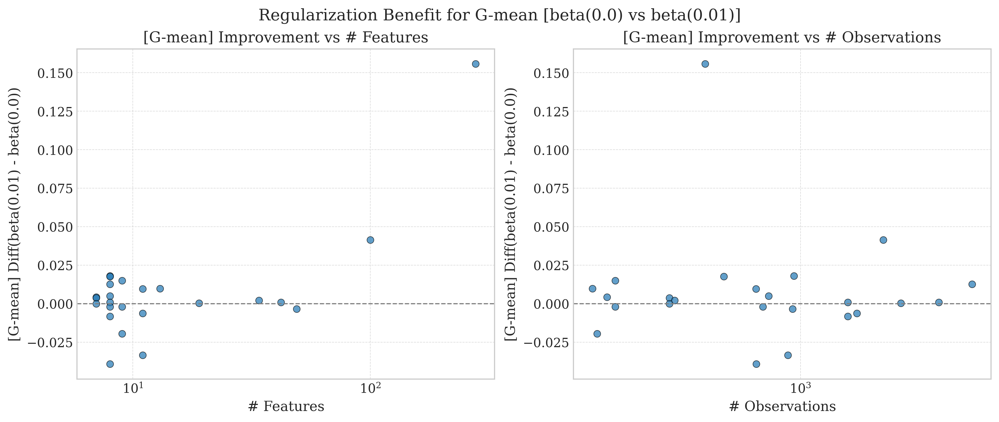

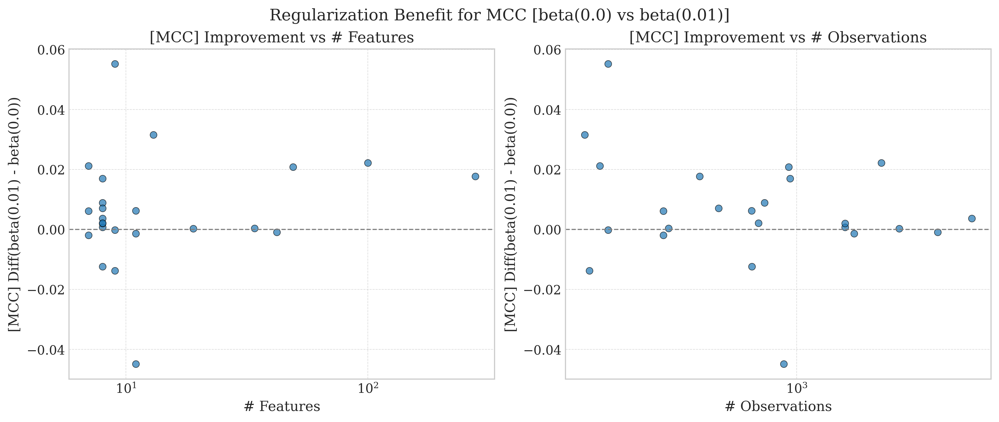

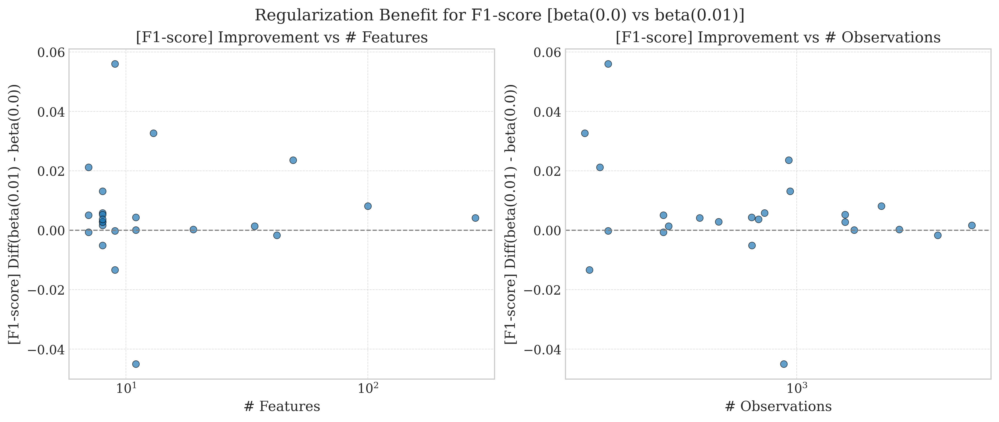

In [11]:
# Select two beta settings to compare (e.g., no reg vs light reg)
beta0 = 0.0
beta1 = BETA1

# List of metrics to visualize
metrics = ["AUROC", "G-mean", "MCC", "F1-score"]

# Loop over each metric and invoke the plotting function
for metric in metrics:
    fig, axes = plot_reg_benefit(beta0, beta1, metric, df_by_beta_metric, df_info)


In [12]:
def annotate_ranked_metrics(
    metric_tables: Dict[float, Dict[str, pd.DataFrame]],
    methods: List[str],
    decimals: int = 3
) -> Dict[float, Dict[str, pd.DataFrame]]:
    """
    Annotate each metric table with formatted "value (rank)" entries and summary rows.

    For each beta value and each metric:
        1. Compute descending ranks across methods (ties receive the minimum rank).
        2. Format each cell as "value (rank)" with specified decimal precision.
        3. Append two summary rows:
            - 'Rank 1(2)': counts of rank-1 and rank-2 occurrences per method.
            - 'Avg Rank': average rank per method.

    Parameters
    ----------
    metric_tables : dict of {beta: {metric: DataFrame}}
        Nested metric tables with raw float values.
    methods : list of str
        Desired column orders for methods.
    decimals : int
        Number of decimal places for metric values.

    Returns
    -------
    updated_tables : dict of {beta: {metric: DataFrame}}
        Annotated metric tables with formatted entries and summary rows.
    """
    updated_tables: Dict[float, Dict[str, pd.DataFrame]] = {}

    for beta_val, metrics_dict in metric_tables.items():
        annotated_metrics: Dict[str, pd.DataFrame] = {}
        for metric_name, df in metrics_dict.items():
            # 1) Compute descending rank (ties get the minimum rank)
            df_rank = df.dropna().rank(axis=1, method='min', ascending=False)

            # 2) Format as "value (rank)"
            df_values = df.round(decimals).astype(str)
            df_ranks = df_rank.astype(int).astype(str)
            df_formatted = df_values + " (" + df_ranks + ")"
            df_formatted = df_formatted.loc[:, methods] # enforce column order

            # 3) Count occurrences of rank 1 and rank 2
            cnt_rank1 = (df_rank == 1).sum(axis=0)
            cnt_rank2 = (df_rank == 2).sum(axis=0)
            summary_cnts = cnt_rank1.astype(str) + " (" + cnt_rank2.astype(str) + ")"

            # 4) Compute average rank
            avg_ranks = df_rank.mean(axis=0).round(2).astype(str)

            # 5) Append summary rows
            df_formatted.loc['Rank 1(2)'] = summary_cnts
            df_formatted.loc['Avg Rank'] = avg_ranks

            annotated_metrics[metric_name] = df_formatted
        
        updated_tables[beta_val] = annotated_metrics
    
    return updated_tables

In [13]:
updated_df_by_beta_metric = annotate_ranked_metrics(df_by_beta_metric, FIXED_METHOD_ORDER)

In [14]:
# -----------------------------------------------------------------------------
# Filter datasets where 'Ours' ranks ≥ threshold for all specified metrics
# -----------------------------------------------------------------------------
# 1) Parameters
beta_value: float = BETA1
low_threshold: int = 4
high_threshold: int = 8

# 1) Build a DataFrame of 'Ours' ranks for each metric
df_ranks = pd.DataFrame({
    metric: (
        updated_df_by_beta_metric[beta_value][metric]
        .map(lambda s: int(s.split('(')[1].rstrip(')'))
                  if isinstance(s, str) and '(' in s else np.nan)
        ['Ours']
    )
    for metric in metrics
})

# 2) Condition A: 'Ours' rank > low_threshold across all metrics
cond_a = (df_ranks.iloc[2:] > low_threshold).all(axis=1)

# 3) Condition B: 'Ours' rank > high_threshold across all metrics
cond_b = (df_ranks.iloc[2:] >= high_threshold).any(axis=1)

# 4) Combine both conditions
# Ensure the boolean index matches the length of df_ranks
filtered_index = df_ranks.index[2:][cond_a | cond_b]

print(f"Datasets filtered (rank>{low_threshold} metrics or rank>{high_threshold} ∀ metrics):")
print(list(filtered_index))

Datasets filtered (rank>4 metrics or rank>8 ∀ metrics):
['australian', 'ecoli-0-3-4_vs_5', 'ionosphere', 'libras_move', 'optical_digits', 'spectrometer']


In [15]:
print(len(updated_df_by_beta_metric[0.0]['AUROC']) - 2)
print(len(list(filtered_index)) - 1)

36
5


In [16]:
# -----------------------------------------------------------------------------
# 1) Exclude the filtered datasets (rows) from all annotated metric tables
# -----------------------------------------------------------------------------
# `filtered_index` is a pd.Index of dataset names to remove
# `updated_df_by_beta_metric` is your annotated dict from earlier

cleaned_df_by_beta_metric: Dict[float, Dict[str, pd.DataFrame]] = {
    beta: {
        metric: df.drop(index=filtered_index, errors='ignore')
        for metric, df in metric_dict.items()
    }
    for beta, metric_dict in updated_df_by_beta_metric.items()
}

In [17]:
# 1) Define summary row identifiers
COUNT_ROW = 'Rank 1(2)'
AVG_ROW   = 'Avg Rank'

# 2) Prepare container for summary results
summary: Dict[str, Dict[str, Optional[float]]] = {}

for metric_name in metrics:
    # Initialize best-value trackers
    best_avg_beta: Optional[float] = None
    best_count1_beta: Optional[float] = None
    best_count12_beta: Optional[float] = None

    best_avg_val: float = float('inf')
    best_c1_val: int   = -1
    best_c12_val: int  = -1

    # Iterate over each beta settings
    for beta_val, metric_dict in cleaned_df_by_beta_metric.items():
        df_fmt: pd.DataFrame = metric_dict[metric_name]

        # 3a) Parse counts of 1st and 2nd ranks for 'Ours'
        count_str: str = df_fmt.at[COUNT_ROW, 'Ours']  # e.g. "9 (3)"
        c1: int = int(count_str.split()[0])
        c2: int = int(count_str.split('(')[1].rstrip(')'))
        c12: int = c1 + c2

        # 3b) Parse average rank for 'Ours'
        avg_str: str = df_fmt.at[AVG_ROW, 'Ours']
        avg_val: float = float(avg_str)

        # 4) Update best beta based on each criterion
        if avg_val < best_avg_val:
            best_avg_val = avg_val
            best_avg_beta = beta_val
        if c1 > best_c1_val:
            best_c1_val = c1
            best_count1_beta = beta_val
        if c12 > best_c12_val:
            best_c12_val = c12
            best_count12_beta = beta_val

    # Store results for this metric
    summary[metric_name] = {
        'best_avg_rank_beta': best_avg_beta,
        'best_count1_beta': best_count1_beta,
        'best_count1+2_beta': best_count12_beta
    }

# 5) Convert to DataFrame and display
import pandas as pd
summary_df: pd.DataFrame = pd.DataFrame.from_dict(summary, orient='index')
display(summary_df)

,best_avg_rank_beta,best_count1_beta,best_count1+2_beta
AUROC,0.01,0.05,0.10
G-mean,0.01,0.01,0.01
MCC,0.01,0.01,0.01
F1-score,0.01,0.10,0.01


In [18]:
df_numeric_by_beta_metric: Dict[float, Dict[str, pd.DataFrame]] = {
    beta: {
        metric: df_fmt.map(
            lambda x: float(str(x).split()[0]) if isinstance(x, str) and '(' in x else float('nan')
        )
        for metric, df_fmt in metric_dict.items()
    }
    for beta, metric_dict in cleaned_df_by_beta_metric.items()
}
metrics: List[str] = list(next(iter(df_numeric_by_beta_metric.values())).keys())
beta_vals: List[float] = sorted(df_numeric_by_beta_metric.keys())

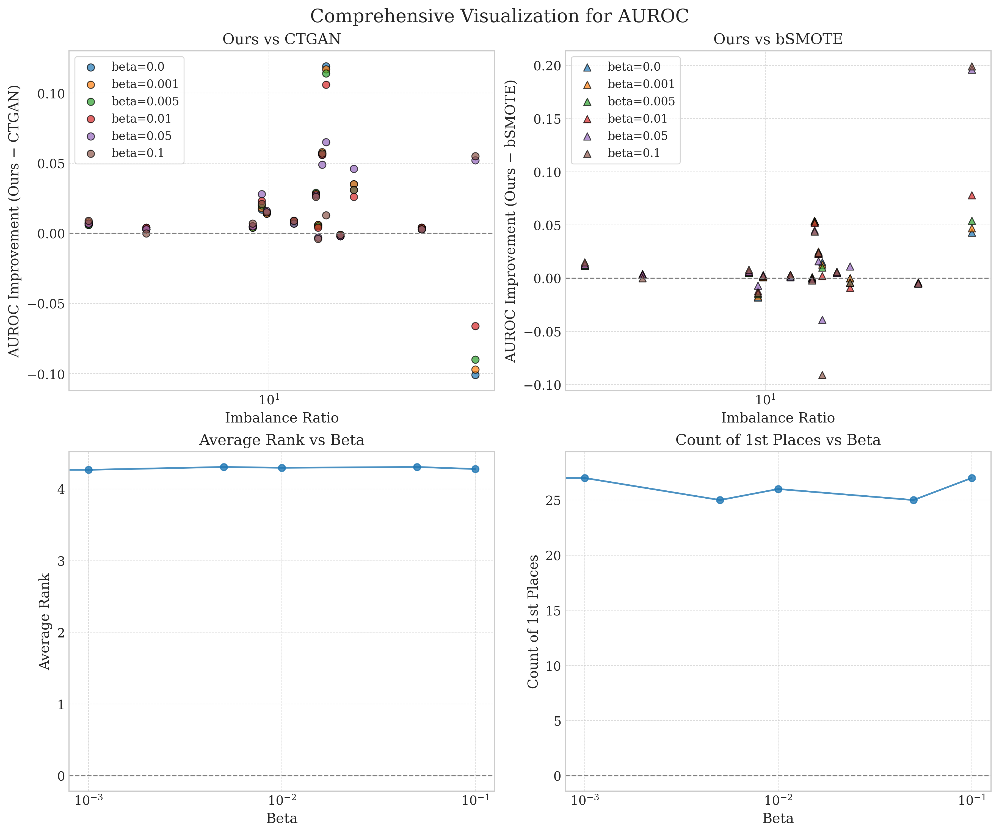

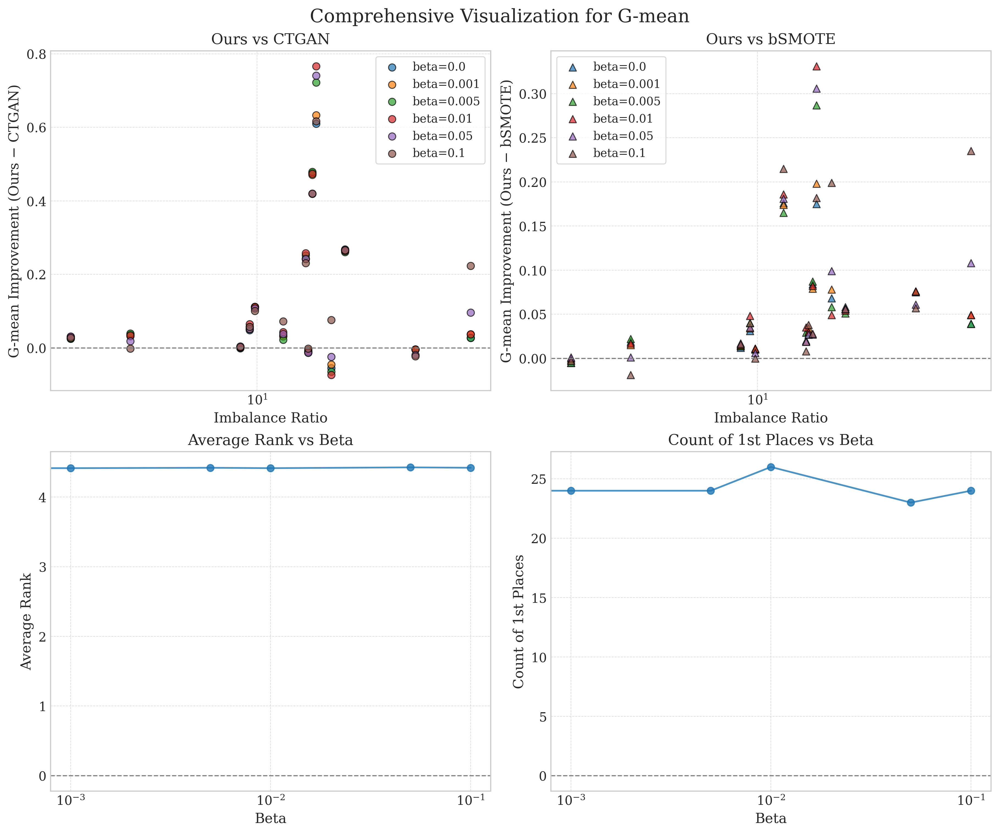

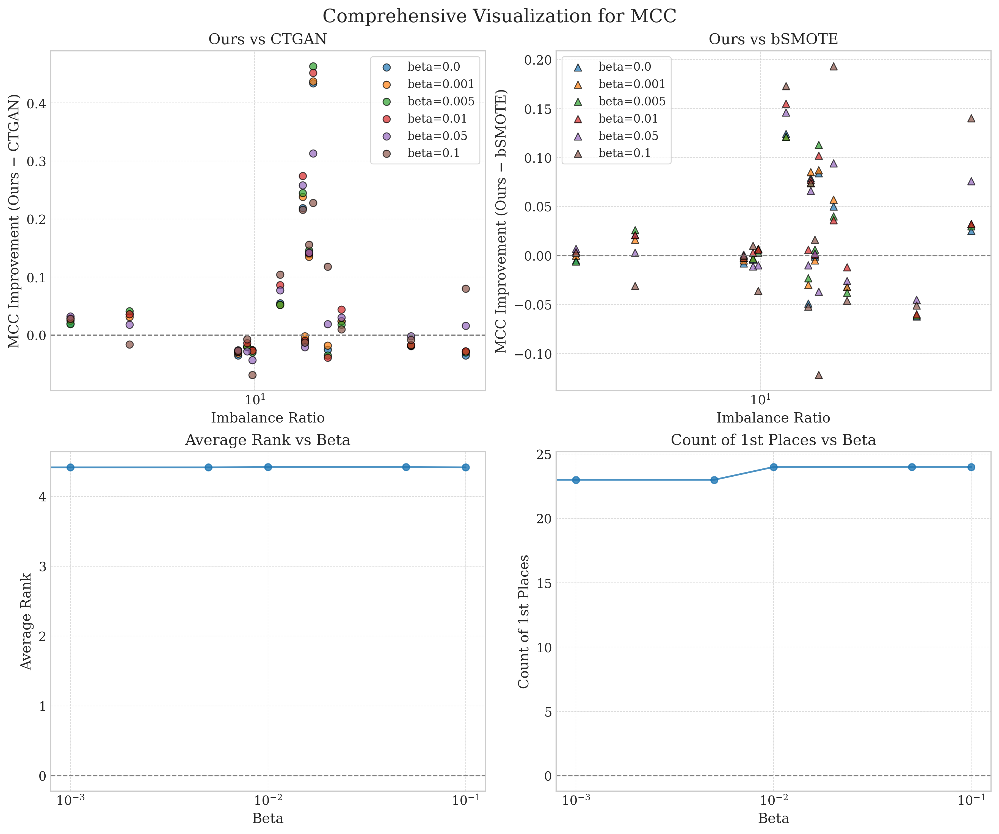

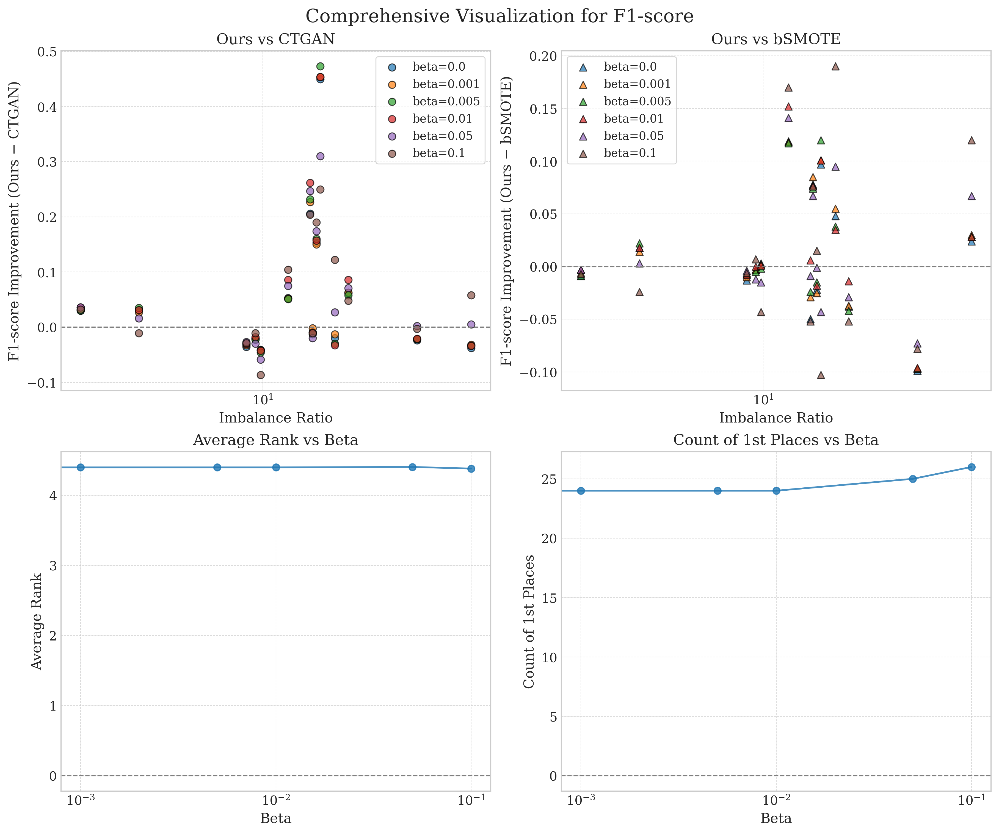

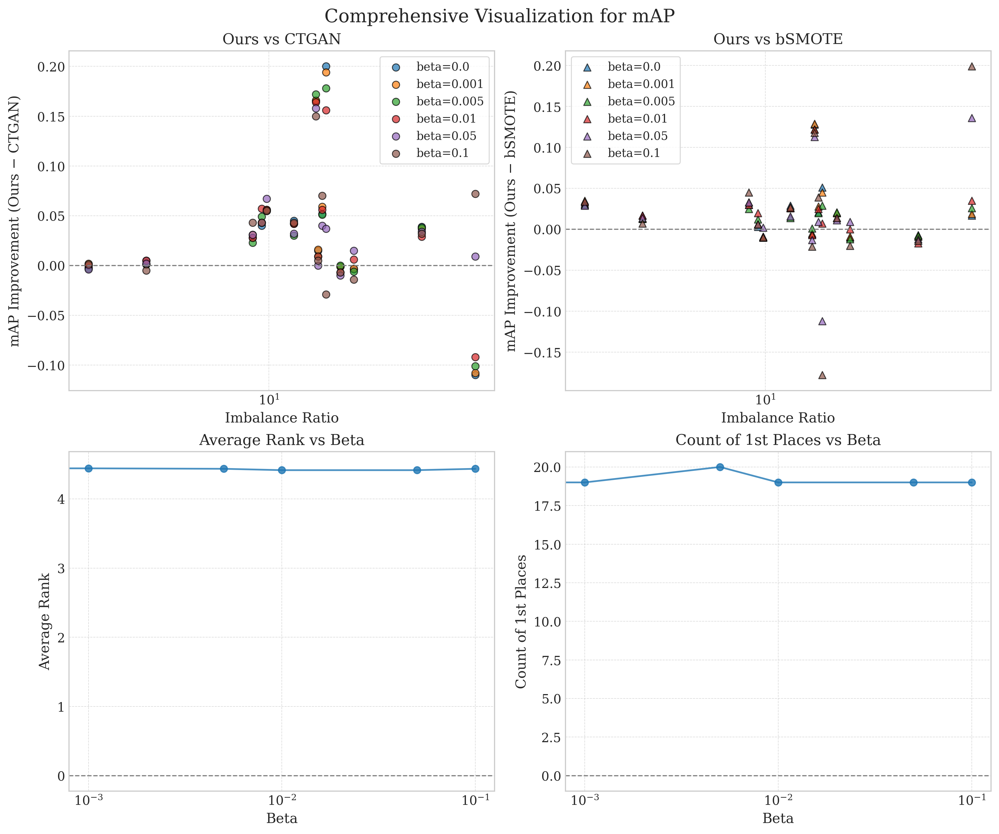

In [19]:
for metric in metrics:
    fig, axes = plt.subplots(2, 2, figsize=(12, 10), constrained_layout=True)
    fig.suptitle(f'Comprehensive Visualization for {metric}', fontsize=16)

    # Top-left: Ours vs CTGAN
    ax = axes[0, 0]
    for beta in beta_vals:
        df_perf = df_numeric_by_beta_metric[beta][metric]
        if 'CTGAN' in df_perf.columns:
            imp = df_perf['Ours'] - df_perf['CTGAN']
            df_plot = df_info.join(imp.rename('imp')).dropna(subset=['imp'])
            ax.scatter(
                df_plot['imbalance_ratio'], df_plot['imp'],
                label=f'beta={beta}', alpha=0.7, s=40, edgecolor='k'
            )
    ax.set_xscale('log')
    ax.set_xlabel('Imbalance Ratio', fontsize=12)
    ax.set_ylabel(f'{metric} Improvement (Ours − CTGAN)', fontsize=12)
    ax.set_title('Ours vs CTGAN', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.legend()

    # Top-right: Ours vs bSMOTE
    ax = axes[0, 1]
    for beta in beta_vals:
        df_perf = df_numeric_by_beta_metric[beta][metric]
        if 'bSMOTE' in df_perf.columns:
            imp = df_perf['Ours'] - df_perf['bSMOTE']
            df_plot = df_info.join(imp.rename('imp')).dropna(subset=['imp'])
            ax.scatter(
                df_plot['imbalance_ratio'], df_plot['imp'],
                label=f'beta={beta}', alpha=0.7, s=40, marker='^', edgecolor='k'
            )
    ax.set_xscale('log')
    ax.set_xlabel('Imbalance Ratio', fontsize=12)
    ax.set_ylabel(f'{metric} Improvement (Ours − bSMOTE)', fontsize=12)
    ax.set_title('Ours vs bSMOTE', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.legend()

    # Bottom-left: Average Rank vs Beta
    avg_ranks: List[float] = []
    for beta in beta_vals:
        df_perf = df_numeric_by_beta_metric[beta][metric]
        rank_mat = df_perf.dropna().rank(axis=1, method='min', ascending=False)
        avg_ranks.append(rank_mat.values.mean())
    ax = axes[1, 0]
    ax.plot(beta_vals, avg_ranks, marker='o', linestyle='-', alpha=0.8)
    ax.set_xscale('log')
    ax.set_xlabel('Beta', fontsize=12)
    ax.set_ylabel('Average Rank', fontsize=12)
    ax.set_title('Average Rank vs Beta', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)

    # Bottom-right: Count of 1st Places vs Beta
    counts1: List[int] = []
    for beta in beta_vals:
        df_perf = df_numeric_by_beta_metric[beta][metric]
        rank_mat = df_perf.rank(axis=1, method='min', ascending=False)
        counts1.append(int((rank_mat == 1).sum().sum()))
    ax = axes[1, 1]
    ax.plot(beta_vals, counts1, marker='o', linestyle='-', alpha=0.8)
    ax.set_xscale('log')
    ax.set_xlabel('Beta', fontsize=12)
    ax.set_ylabel('Count of 1st Places', fontsize=12)
    ax.set_title('Count of 1st Places vs Beta', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.show()

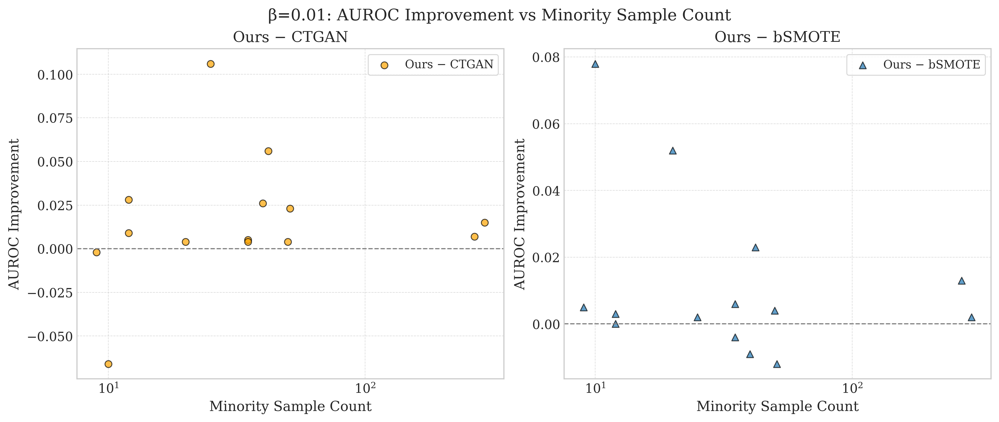

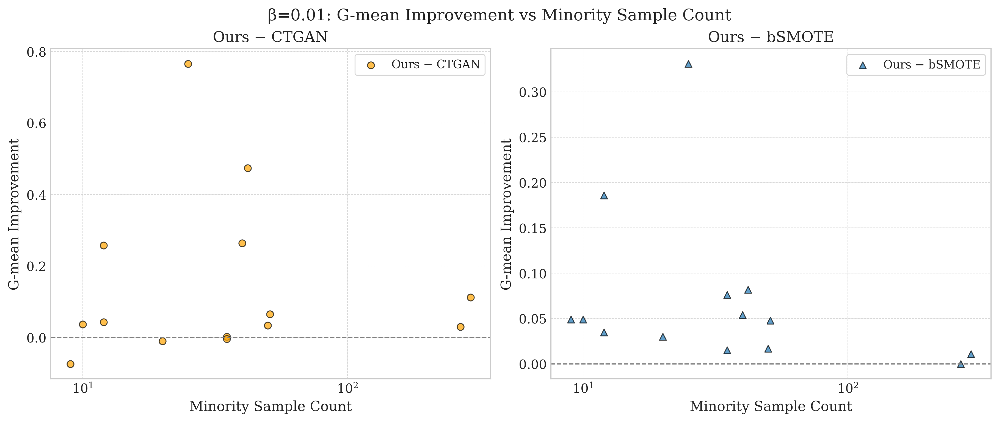

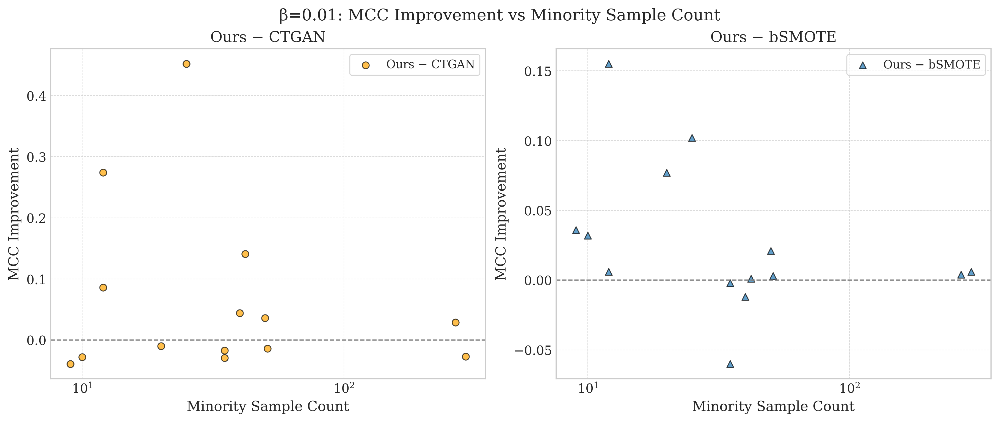

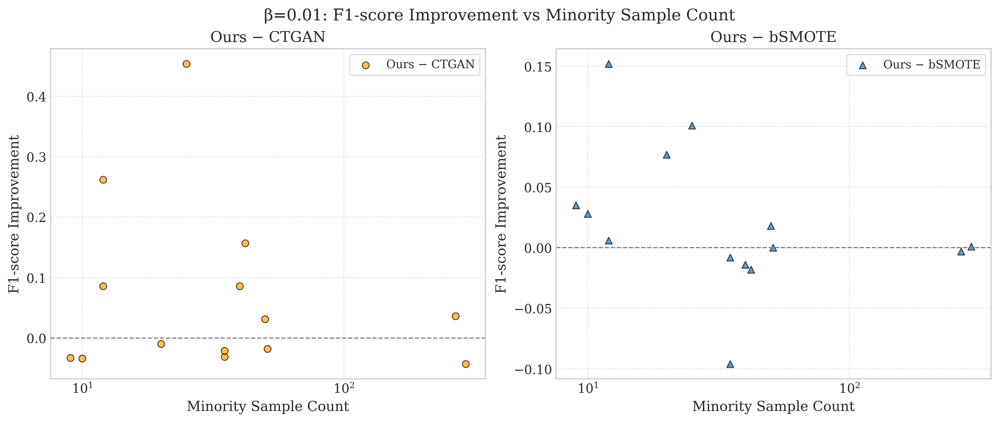

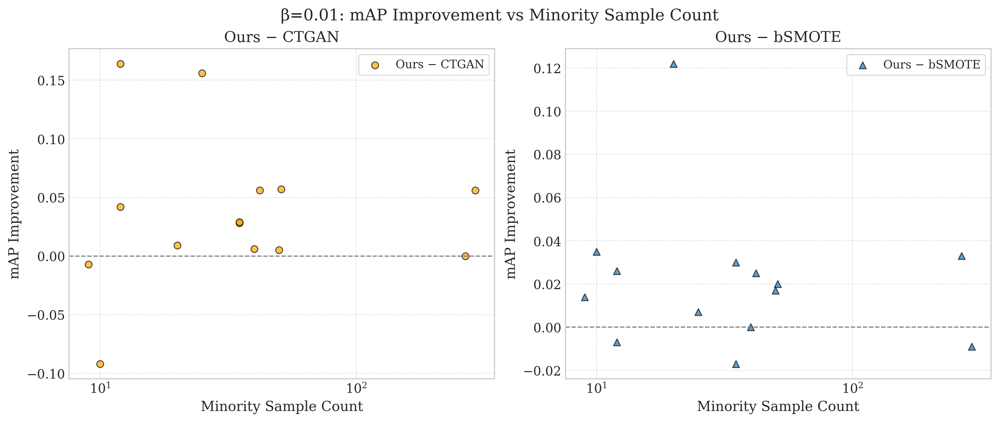

In [20]:
# 1) Fixed regularization coefficient
beta_fixed: float = BETA1
 
for metric_name, df_perf in df_numeric_by_beta_metric[beta_fixed].items():
    # 1) Exclude filtered datasets
    df_clean = df_perf.drop(index=filtered_index, errors='ignore')

    # 2) Prepare 1×2 subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

    # A) Ours − CTGAN
    ax = axes[0]
    if 'CTGAN' in df_clean.columns:
        diff_ct = df_clean['Ours'] - df_clean['CTGAN']
        df_ct = df_info.join(diff_ct.rename('improvement')).dropna(subset=['improvement'])
        ax.scatter(
            df_ct['n_minority'], df_ct['improvement'],
            marker='o', color='orange', alpha=0.7, edgecolor='k', label='Ours − CTGAN'
        )
    ax.set_xscale('log')
    ax.set_xlabel('Minority Sample Count', fontsize=12)
    ax.set_ylabel(f'{metric_name} Improvement', fontsize=12)
    ax.set_title('Ours − CTGAN', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.legend(fontsize=10)

    # B) Ours − bSMOTE
    ax = axes[1]
    if 'bSMOTE' in df_clean.columns:
        diff_bs = df_clean['Ours'] - df_clean['bSMOTE']
        df_bs = df_info.join(diff_bs.rename('improvement')).dropna(subset=['improvement'])
        ax.scatter(
            df_bs['n_minority'], df_bs['improvement'],
            marker='^', alpha=0.7, edgecolor='k', label='Ours − bSMOTE'
        )
    ax.set_xscale('log')
    ax.set_xlabel('Minority Sample Count', fontsize=12)
    ax.set_ylabel(f'{metric_name} Improvement', fontsize=12)
    ax.set_title('Ours − bSMOTE', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.legend(fontsize=10)

    # 3) Super-title
    fig.suptitle(
        f'β={beta_fixed}: {metric_name} Improvement vs Minority Sample Count',
        fontsize=14
    )
    plt.show()

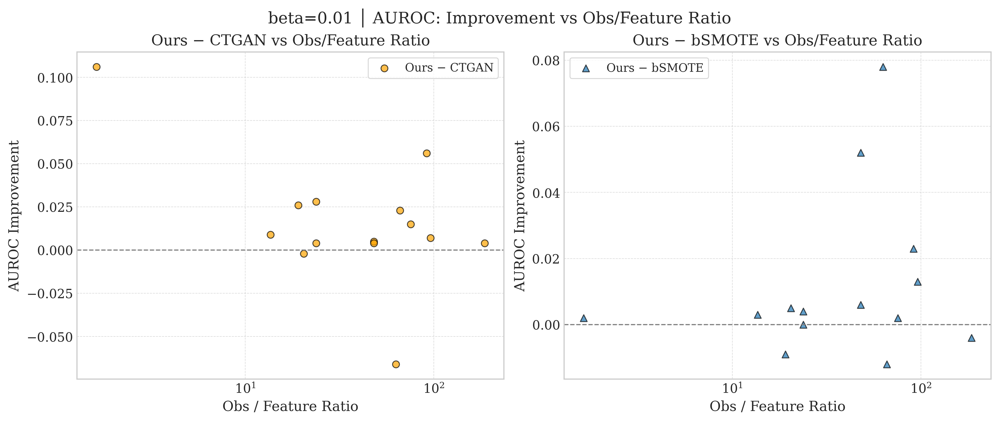

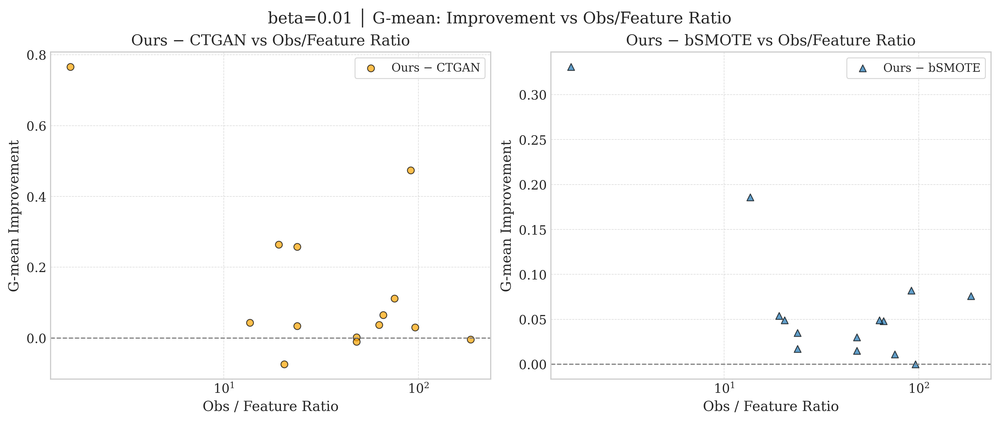

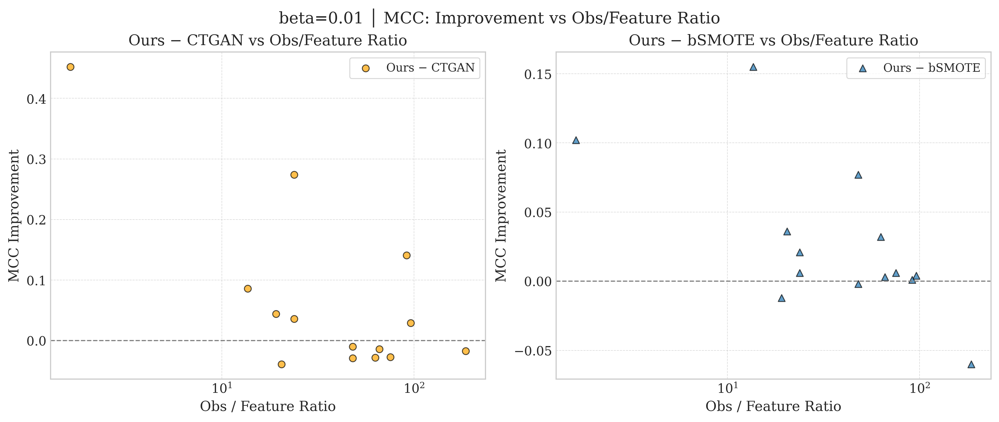

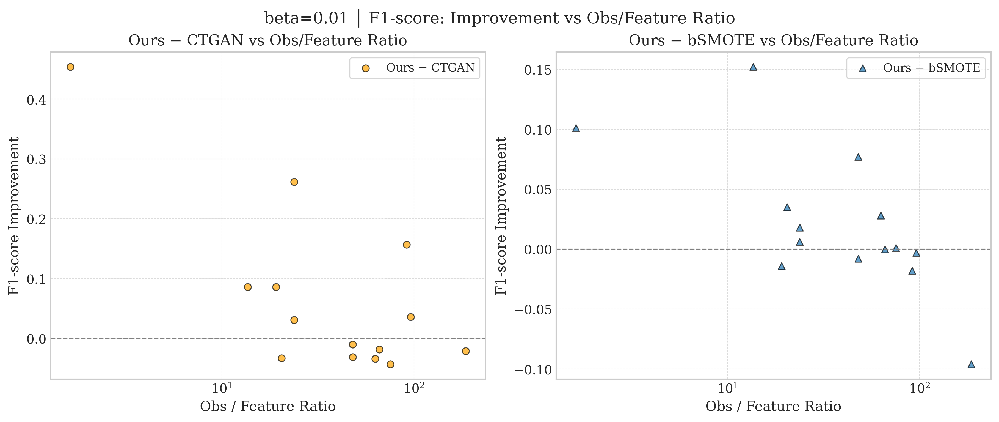

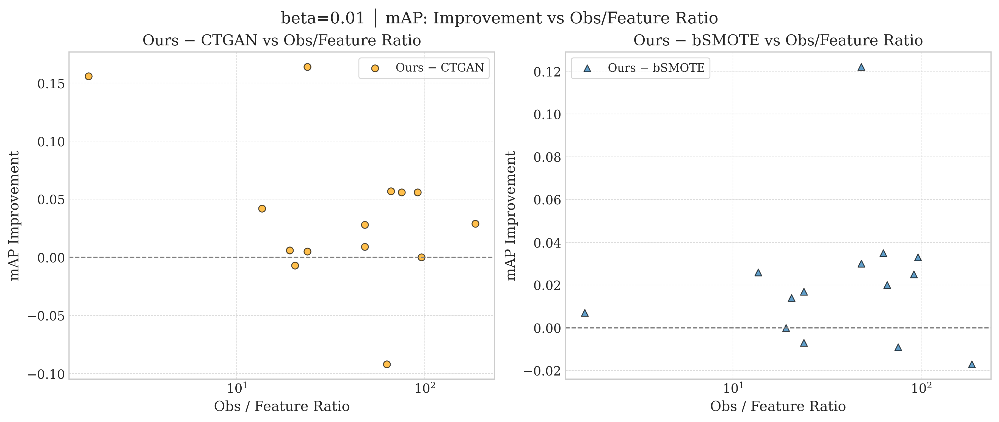

In [21]:
perf_dict: Dict[str, pd.DataFrame] = df_numeric_by_beta_metric[beta_fixed]

for metric_name, df_perf in perf_dict.items():
    # Create a 1×2 grid of subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)
    fig.suptitle(
        f'beta={beta_fixed} │ {metric_name}: Improvement vs Obs/Feature Ratio',
        fontsize=14
    )

    # A) Ours − CTGAN
    ax = axes[0]
    if 'CTGAN' in df_perf.columns:
        diff_ct: pd.Series = df_perf['Ours'] - df_perf['CTGAN']
        df_ct: pd.DataFrame = (
            df_info
            .join(diff_ct.rename('improvement'))
            .dropna(subset=['improvement'])
        )
        ax.scatter(
            df_ct['obs_feat_ratio'], df_ct['improvement'],
            marker='o', color='orange', alpha=0.7, edgecolor='k', label='Ours − CTGAN'
        )
    ax.set_xscale('log')
    ax.set_xlabel('Obs / Feature Ratio', fontsize=12)
    ax.set_ylabel(f'{metric_name} Improvement', fontsize=12)
    ax.set_title('Ours − CTGAN vs Obs/Feature Ratio', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.legend(fontsize=10)

    # B) Ours − bSMOTE
    ax = axes[1]
    if 'bSMOTE' in df_perf.columns:
        diff_bs: pd.Series = df_perf['Ours'] - df_perf['bSMOTE']
        df_bs: pd.DataFrame = (
            df_info
            .join(diff_bs.rename('improvement'))
            .dropna(subset=['improvement'])
        )
        ax.scatter(
            df_bs['obs_feat_ratio'], df_bs['improvement'],
            marker='^', alpha=0.7, edgecolor='k', label='Ours − bSMOTE'
        )
    ax.set_xscale('log')
    ax.set_xlabel('Obs / Feature Ratio', fontsize=12)
    ax.set_ylabel(f'{metric_name} Improvement', fontsize=12)
    ax.set_title('Ours − bSMOTE vs Obs/Feature Ratio', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.legend(fontsize=10)

    plt.show()

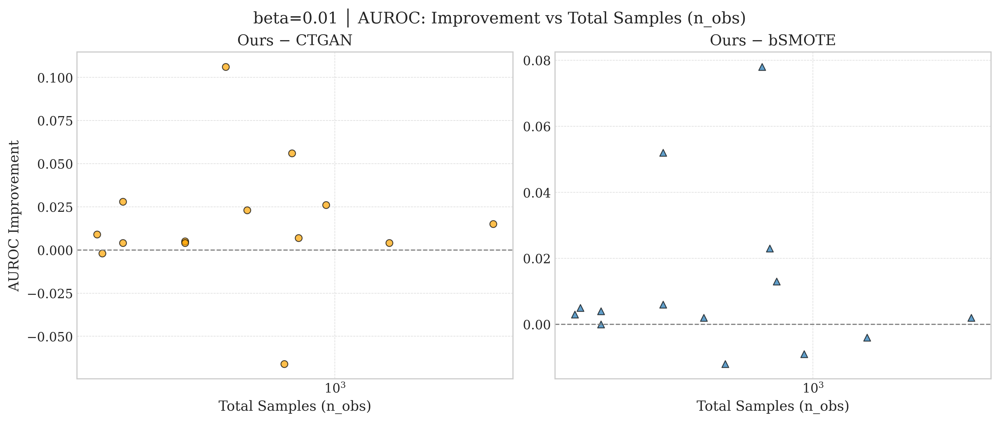

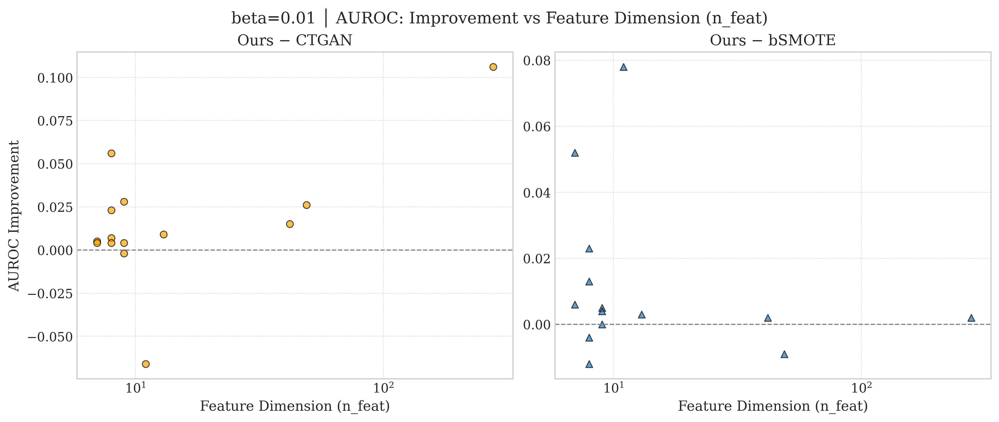

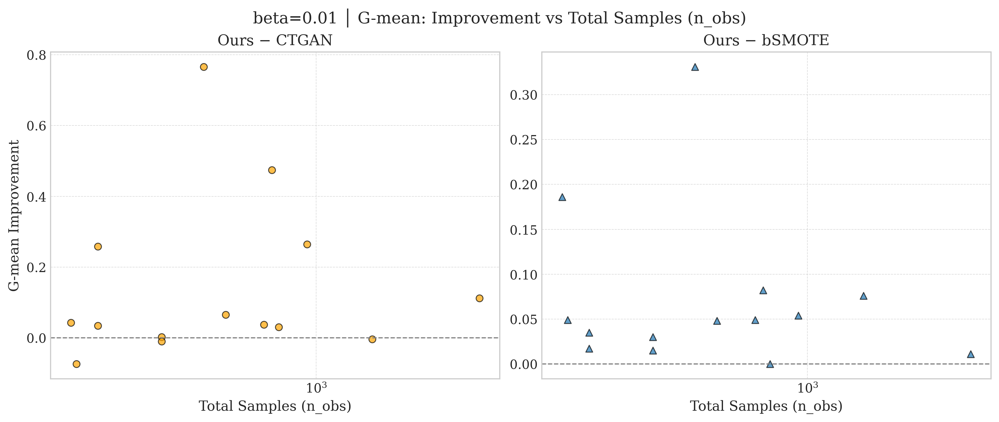

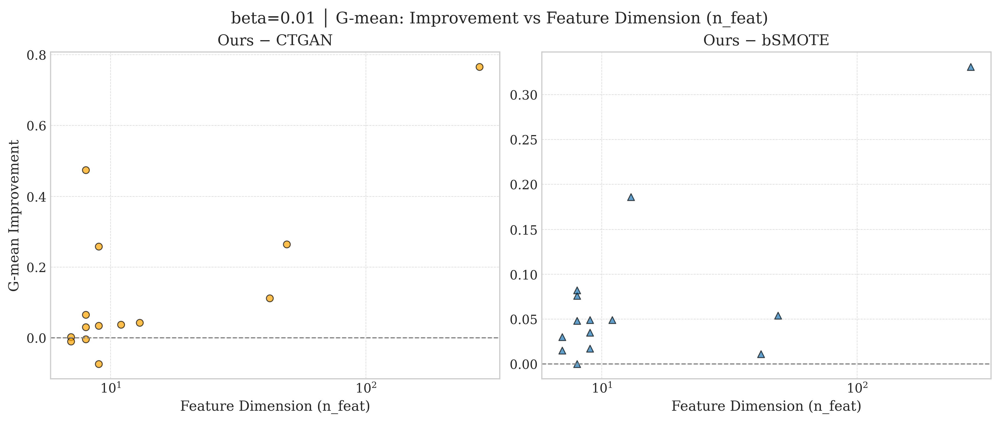

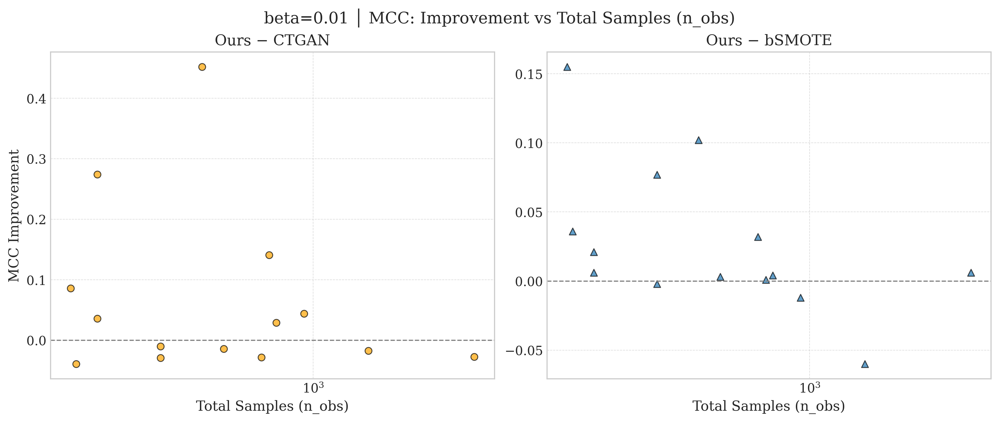

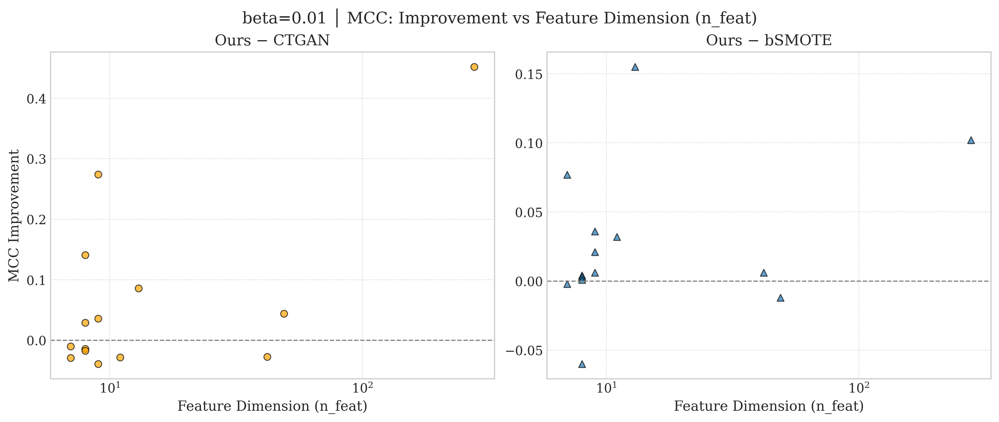

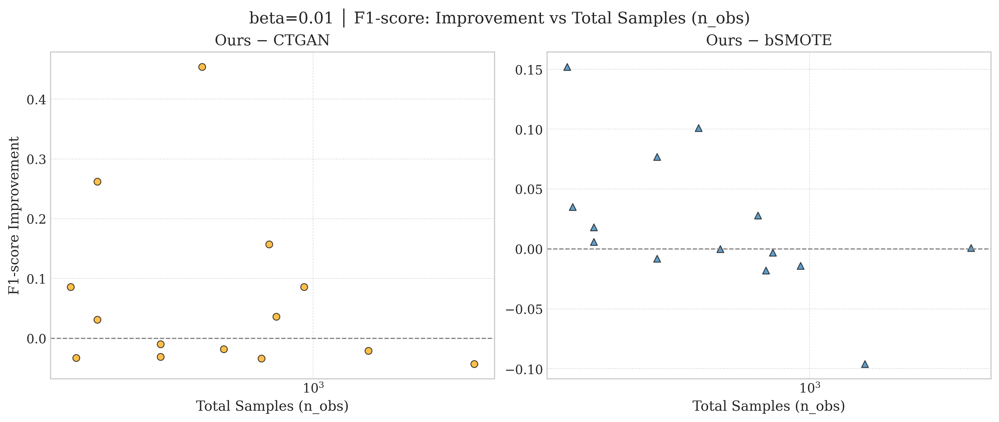

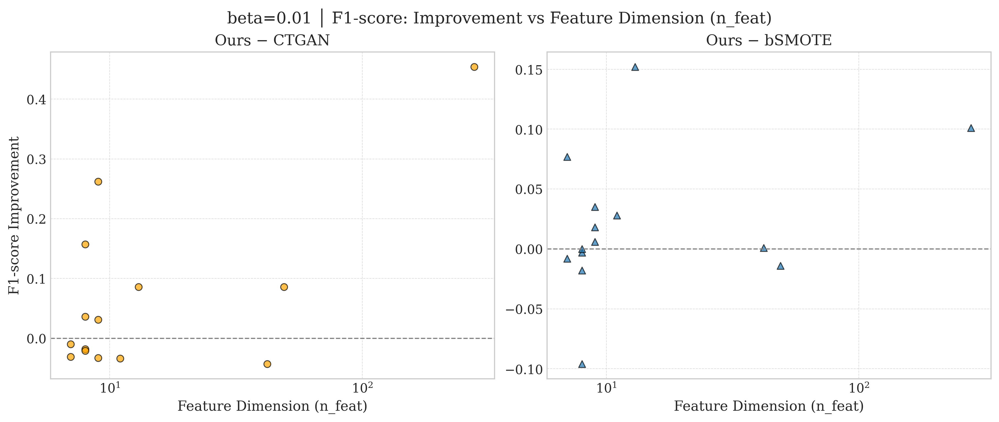

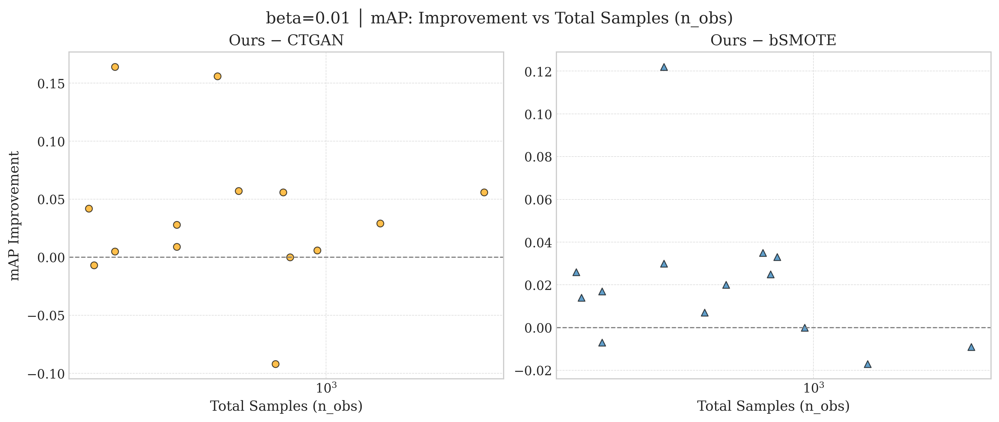

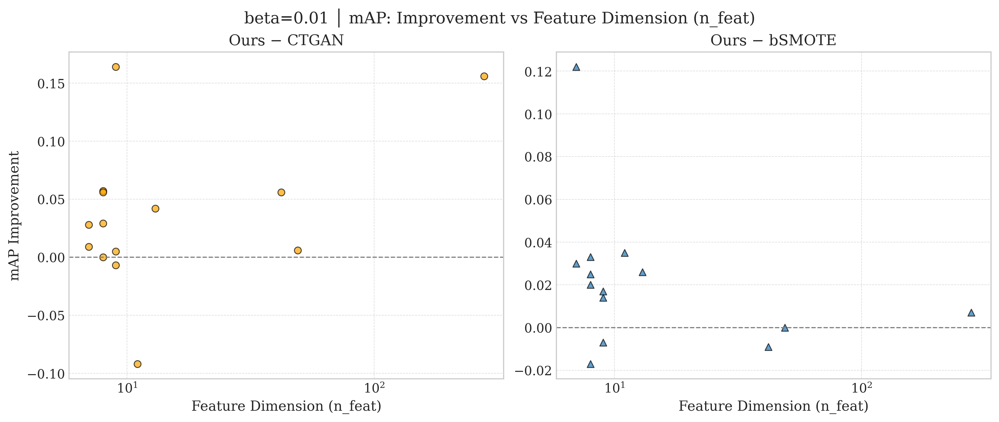

In [22]:
for metric_name, df_perf in df_numeric_by_beta_metric[beta_fixed].items():
    # Compute improvements; default to zero if comparator missing
    imp_ct = df_perf['Ours'] - df_perf.get('CTGAN', df_perf['Ours'])
    imp_bs = df_perf['Ours'] - df_perf.get('bSMOTE', df_perf['Ours'])

    # 1) Improvement vs Total Samples (n_obs)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)
    fig.suptitle(
        f'beta={beta_fixed} │ {metric_name}: Improvement vs Total Samples (n_obs)',
        fontsize=14
    )

    # A) Ours − CTGAN
    ax = axes[0]
    df_ct = (
        df_info
        .join(imp_ct.rename('improvement'))
        .dropna(subset=['improvement'])
    )
    ax.scatter(
        df_ct['n_obs'], df_ct['improvement'],
        marker='o', alpha=0.7, color='orange', edgecolor='k', label='Ours − CTGAN'
    )
    ax.set_xscale('log')
    ax.set_xlabel('Total Samples (n_obs)', fontsize=12)
    ax.set_ylabel(f'{metric_name} Improvement', fontsize=12)
    ax.set_title('Ours − CTGAN', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)


    # B) Ours − bSMOTE
    ax = axes[1]
    df_bs = (
        df_info
        .join(imp_bs.rename('improvement'))
        .dropna(subset=['improvement'])
    )
    ax.scatter(
        df_bs['n_obs'], df_bs['improvement'],
        marker='^', alpha=0.7, edgecolor='k', label='Ours − bSMOTE'
    )
    ax.set_xscale('log')
    ax.set_xlabel('Total Samples (n_obs)', fontsize=12)
    ax.set_title('Ours − bSMOTE', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.show()

    # 2) Improvement vs Feature Dimension (n_feat)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)
    fig.suptitle(
        f'beta={beta_fixed} │ {metric_name}: Improvement vs Feature Dimension (n_feat)',
        fontsize=14
    )

    # A) Ours − CTGAN
    ax = axes[0]
    ax.scatter(
        df_ct['n_feat'], df_ct['improvement'],
        marker='o', color='orange', alpha=0.7, edgecolor='k'
    )
    ax.set_xscale('log')
    ax.set_xlabel('Feature Dimension (n_feat)', fontsize=12)
    ax.set_ylabel(f'{metric_name} Improvement', fontsize=12)
    ax.set_title('Ours − CTGAN', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)


    # B) Ours − bSMOTE
    ax = axes[1]
    ax.scatter(
        df_bs['n_feat'], df_bs['improvement'],
        marker='^', alpha=0.7, edgecolor='k'
    )
    ax.set_xscale('log')
    ax.set_xlabel('Feature Dimension (n_feat)', fontsize=12)
    ax.set_title('Ours − bSMOTE', fontsize=13)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.show()

In [23]:
# 1) Paired t-test between Original and Ours
ttest_records = []
for beta, mts in df_numeric_by_beta_metric.items():
    for metric, df in mts.items():
        if {'Original', 'Ours'}.issubset(df.columns):
            df_pair = (
                df[['Original','Ours']]
                .drop(index=[COUNT_ROW, AVG_ROW], errors='ignore')
                .dropna()
            )
            if len(df_pair) < 2:
                continue
            t_stat, p_val = ttest_rel(df_pair['Original'], df_pair['Ours'])
            ttest_records.append({
                'beta': beta,
                'metric': metric,
                'n_pairs': len(df_pair),
                't_stat': t_stat,
                'p_value': p_val
            })
ttest_df = pd.DataFrame(ttest_records).set_index(['beta','metric'])
display(ttest_df)

n_pairs    t_stat   p_value
beta  metric                               
0.000 AUROC          21 -3.043747  0.006411
      G-mean         21 -6.348362  0.000003
      MCC            21 -4.185914  0.000455
      F1-score       21 -4.750013  0.000122
      mAP            18 -0.356247  0.726039
0.001 AUROC          21 -3.047027  0.006364
      G-mean         21 -6.363343  0.000003
      MCC            21 -4.262951  0.000380
      F1-score       21 -4.833580  0.000101
      mAP            18 -0.359759  0.723458
0.005 AUROC          21 -3.022629  0.006724
      G-mean         21 -6.253349  0.000004
      MCC            21 -4.208212  0.000432
      F1-score       21 -4.780639  0.000114
      mAP            18 -0.121062  0.905061
0.010 AUROC          21 -3.032844  0.006571
      G-mean         21 -6.225595  0.000004
      MCC            21 -4.316423  0.000336
      F1-score       21 -4.887256  0.000089
      mAP            18 -0.239369  0.813682
0.050 AUROC          21 -2.461542  0.023046
      G-mean         21 -6.276549  0.000004
      MCC            21 -4.365579  0.000299
      F1-score       21 -4.984842  0.000071
      mAP            18  0.071149  0.944109
0.100 AUROC          21 -2.006033  0.058568
      G-mean         21 -6.443153  0.000003
      MCC            21 -4.145375  0.000501
      F1-score       21 -4.744441  0.000124
      mAP            18 -0.116861  0.908340

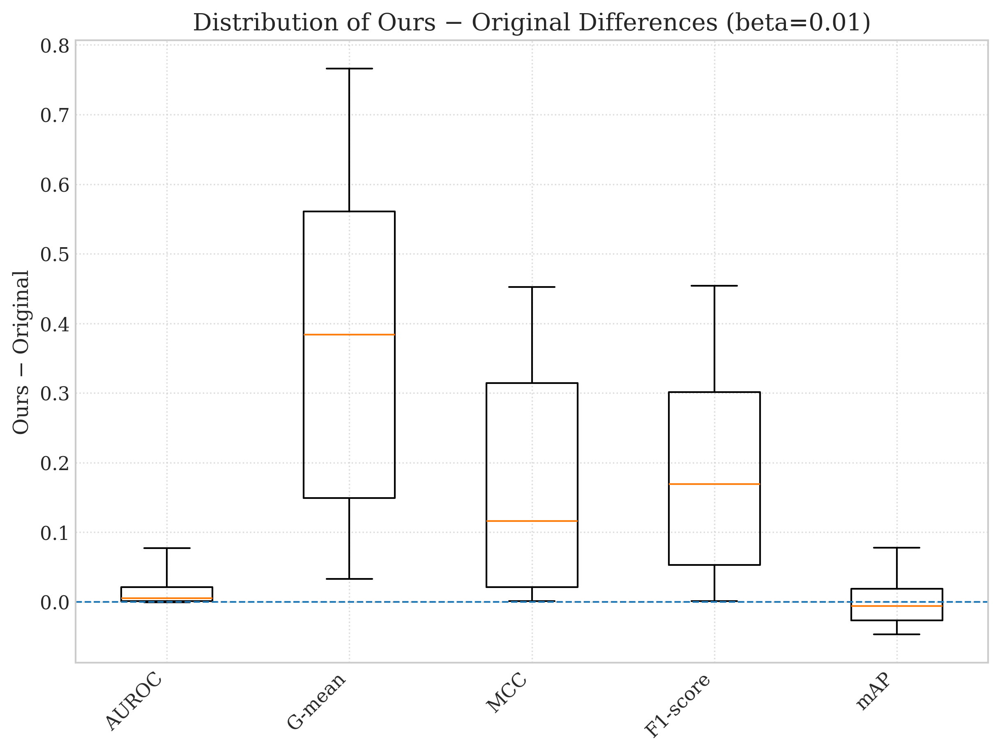

In [24]:
diffs, labels = [], []
for metric, df in df_numeric_by_beta_metric[beta_fixed].items():
    if {'Original','Ours'}.issubset(df.columns):
        arr = (
            df[['Original','Ours']]
            .drop(index=[COUNT_ROW, AVG_ROW], errors='ignore')
            .dropna()
        )
        diffs.append((arr['Ours'] - arr['Original']).values)
        labels.append(metric)

fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
ax.boxplot(diffs, whis=[5,95], showfliers=False)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=11)
ax.axhline(0, linestyle='--', linewidth=1)
ax.set_ylabel('Ours − Original', fontsize=12)
ax.set_title(f'Distribution of Ours − Original Differences (beta={beta_fixed})', fontsize=14)
ax.grid(True, linestyle=':', linewidth=0.8, alpha=0.7)
plt.show()


In [26]:
import os 
import glob

# 데이터가 저장된 디렉토리
data_dir = "/data4/oldrain123/oldrain123/results/ablation_results/beta8"

# 파일 패턴 (예: {data_name}_results_gaussian_beta_{beta}.csv)
pattern = os.path.join(data_dir, "*_results_gaussian_beta_*.csv")
files = glob.glob(pattern)

In [27]:
all_data = []

for file in files:
    # 파일명에서 beta 값 추출
    # 파일명이 {data_name}_results_gaussian_beta_{beta}.csv 형태로 되어 있다고 가정
    basename = os.path.basename(file)
    beta_str = basename.split('_results_gaussian_beta_')[1].replace('.csv', '')
    beta_value = float(beta_str)
    
    # CSV 파일 읽기
    df = pd.read_csv(file)
    # beta 값을 새로운 컬럼으로 추가
    df["beta"] = beta_value
    all_data.append(df)

In [28]:
combined_df = pd.concat(all_data, ignore_index=True)

In [29]:
combined_df.groupby("Classifier")['beta'].value_counts().sort_index()['SVM']

beta
0.000    160
0.001    160
0.005    160
0.010    160
0.050    160
0.100    160
Name: count, dtype: int64

In [32]:
grouped = combined_df.groupby(["Classifier", "Metric", "beta"])["Value"].mean().reset_index()

In [33]:
import ace_tools_open as tools

tools.display_dataframe_to_user(name = 'grouped', dataframe=grouped)

grouped


In [ ]:
classifiers = grouped["Classifier"].unique()
metrics = grouped["Metric"].unique()

fig, axs = plt.subplots(len(classifiers), 1, figsize=(12, 8 * len(classifiers)), sharex=True)

if len(classifiers) == 1:
    axs = [axs]

for i, clf in enumerate(classifiers):
    ax = axs[i]
    sub_df = grouped[grouped["Classifier"] == clf]

    for metric in metrics:
        metric_df = sub_df[sub_df["Metric"] == metric]
        ax.plot(metric_df["beta"], metric_df["Value"], label=metric, marker="o")
        
        # 최고 성능 beta 위치에 마커 추가
        max_idx = metric_df["Value"].idxmax()
        max_row = metric_df.loc[max_idx]
        ax.plot(max_row["beta"], max_row["Value"], marker="*", markersize=12, label=f"{metric} max", linestyle="None")

    ax.set_title(f"{clf}")
    ax.set_xlabel("Beta")
    ax.set_ylabel("Metric Value")
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# beta별 metric 평균값 계산 (각 classifier에 대해)
avg_df = grouped.groupby(["Classifier", "beta"])["Value"].median().reset_index()

# 시각화
fig, axs = plt.subplots(len(classifiers), 1, figsize=(12, 5 * len(classifiers)), sharex=True)

if len(classifiers) == 1:
    axs = [axs]

for i, clf in enumerate(classifiers):
    ax = axs[i]
    clf_df = avg_df[avg_df["Classifier"] == clf]
    
    ax.plot(clf_df["beta"], clf_df["Value"], label="Avg Metric", marker="o", color="black")
    
    # 최고 평균 성능 beta 위치에 마커 추가
    max_idx = clf_df["Value"].idxmax()
    max_row = clf_df.loc[max_idx]
    ax.plot(max_row["beta"], max_row["Value"], marker="*", markersize=14, color="gold", label="Best Avg Beta", linestyle="None")

    ax.set_title(f"{clf} - Average of Metrics")
    ax.set_xlabel("Beta")
    ax.set_ylabel("Average Metric Value")
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
# beta=0.0 데이터가 있는 디렉토리를 추가로 읽어서 병합
dir_beta5 = "/data4/oldrain123/oldrain123/results/ablation_results/beta5"
pattern_beta8 = os.path.join("/data4/oldrain123/oldrain123/results/ablation_results/beta8", "*_results_gaussian_beta_*.csv")
pattern_beta5 = os.path.join(dir_beta5, "*_results_gaussian_beta_0.0.csv")

# 두 디렉토리의 파일을 모두 수집
files = glob.glob(pattern_beta8) + glob.glob(pattern_beta5)

all_data = []
for file in files:
    basename = os.path.basename(file)
    beta_str = basename.split('_results_gaussian_beta_')[1].replace('.csv', '')
    beta_value = float(beta_str)

    df = pd.read_csv(file)
    df["beta"] = beta_value
    all_data.append(df)

# 데이터 병합 및 요약
if all_data:
    combined_df = pd.concat(all_data, ignore_index=True)
    grouped = combined_df.groupby(["Classifier", "Metric", "beta"])["Value"].mean().reset_index()

    # beta별 metric 평균값 계산 (각 classifier에 대해)
    avg_df = grouped.groupby(["Classifier", "beta"])["Value"].mean().reset_index()
    classifiers = avg_df["Classifier"].unique()

    # 시각화
    fig, axs = plt.subplots(len(classifiers), 1, figsize=(12, 5 * len(classifiers)), sharex=True)

    if len(classifiers) == 1:
        axs = [axs]

    for i, clf in enumerate(classifiers):
        ax = axs[i]
        clf_df = avg_df[avg_df["Classifier"] == clf]

        ax.plot(clf_df["beta"], clf_df["Value"], label="Avg Metric", marker="o", color="black")

        # 최고 평균 성능 beta 위치에 마커 추가
        max_idx = clf_df["Value"].idxmax()
        max_row = clf_df.loc[max_idx]
        ax.plot(max_row["beta"], max_row["Value"], marker="*", markersize=14, color="gold", label="Best Avg Beta", linestyle="None")

        ax.set_title(f"{clf} - Average of Metrics")
        ax.set_xlabel("Beta")
        ax.set_ylabel("Average Metric Value")
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    plt.show()
else:
    print("⚠️ No CSV files were found in the specified directories.")

In [ ]:
if all_data:
    combined_df = pd.concat(all_data, ignore_index=True)
    grouped = combined_df.groupby(["Classifier", "Metric", "beta"])["Value"].median().reset_index()

    classifiers = grouped["Classifier"].unique()
    metrics = grouped["Metric"].unique()

    fig, axs = plt.subplots(len(classifiers), 1, figsize=(12, 8 * len(classifiers)), sharex=True)

    if len(classifiers) == 1:
        axs = [axs]

    for i, clf in enumerate(classifiers):
        ax = axs[i]
        sub_df = grouped[grouped["Classifier"] == clf]

        for metric in metrics:
            metric_df = sub_df[sub_df["Metric"] == metric]
            ax.plot(metric_df["beta"], metric_df["Value"], label=metric, marker="o")

            # 최고 성능 beta 위치에 마커 추가
            max_idx = metric_df["Value"].idxmax()
            max_row = metric_df.loc[max_idx]
            ax.plot(max_row["beta"], max_row["Value"], marker="*", markersize=12, label=f"{metric} max", linestyle="None")

        ax.set_title(f"{clf}")
        ax.set_xlabel("Beta")
        ax.set_ylabel("Metric Value")
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    plt.show()
else:
    print("No CSV files were found in the specified directories.")

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# grouped: DataFrame with columns [Classifier, Metric, beta, Value] from your code
# 1) 베이스라인 값(β=0) 추출
baseline = (
    grouped[grouped['beta'] == 0.0]
    .set_index(['Classifier','Metric'])['Value']
    .rename('baseline')
)

# 2) 원본에 baseline 합치고 delta 계산
df2 = (
    grouped
    .set_index(['Classifier','Metric'])
    .join(baseline, on=['Classifier','Metric'])
    .reset_index()
)
df2['delta'] = df2['Value'] - df2['baseline']

# 3) delta 시각화
classifiers = df2['Classifier'].unique()
metrics     = df2['Metric'].unique()

fig, axs = plt.subplots(len(classifiers), 1, figsize=(10, 4*len(classifiers)), sharex=True)

if len(classifiers)==1: axs=[axs]

for i, clf in enumerate(classifiers):
    ax = axs[i]
    sub = df2[df2['Classifier']==clf]
    for metric in metrics:
        mdf = sub[sub['Metric']==metric]
        ax.plot(mdf['beta'], mdf['delta'], marker='o', label=metric)
    ax.set_xscale('log')
    ax.set_ylabel('Δ Value vs β=0')
    ax.set_title(f'{clf} — Absolute Δ')
    ax.grid(True)
    ax.legend()

axs[-1].set_xlabel('Beta')
plt.tight_layout()
plt.show()

In [ ]:
# 1) rel_change 계산
df2['rel_pct'] = 100 * (df2['Value'] - df2['baseline']) / df2['baseline']

# 2) rel_pct 시각화 (위와 동일 구조)
fig, axs = plt.subplots(len(classifiers), 1, figsize=(10, 4*len(classifiers)), sharex=True)
if len(classifiers)==1: axs=[axs]

for i, clf in enumerate(classifiers):
    ax = axs[i]
    sub = df2[df2['Classifier']==clf]
    for metric in metrics:
        mdf = sub[sub['Metric']==metric]
        ax.plot(mdf['beta'], mdf['rel_pct'], marker='^', label=metric)
    ax.set_xscale('log')
    ax.set_ylabel('Relative % Change')
    ax.set_title(f'{clf} — % Change vs β=0')
    ax.grid(True)
    ax.legend()

axs[-1].set_xlabel('Beta')
plt.tight_layout()
plt.show()